In [19]:
from lane import *

# Camera Calibration

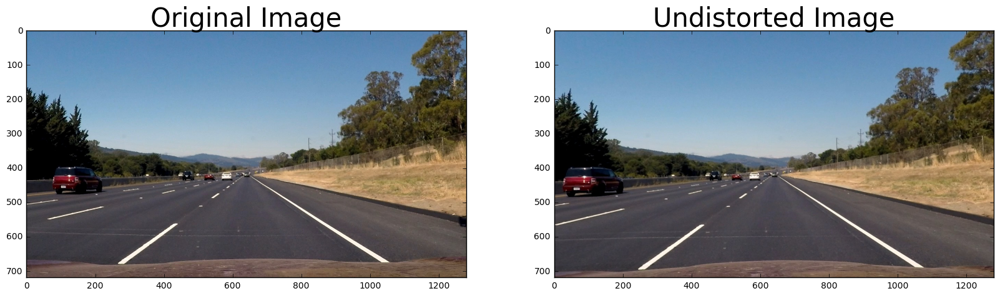

In [9]:
undistort = cam_calibration()
mtx = undistort.mtx
dist = undistort.dist

raw = cv2.imread("test_images/straight_lines2.jpg")
raw = cv2.cvtColor(raw, cv2.COLOR_BGR2RGB)

corrected_raw = cv2.undistort(raw, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(raw)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(corrected_raw)
ax2.set_title('Undistorted Image', fontsize=30)

# Percpective Transform

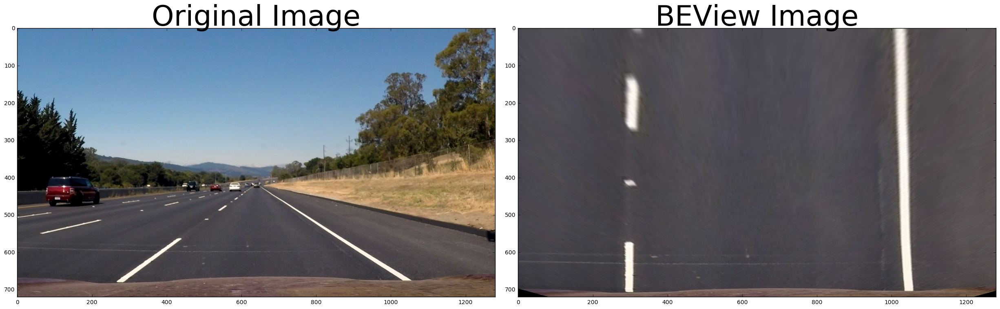

In [10]:
M = PTransform().M
Minv = PTransform().Minv

raw = cv2.imread("test_images/straight_lines2.jpg")
image = cv2.cvtColor(raw, cv2.COLOR_BGR2RGB)

imshape = image.shape
image_warped = cv2.warpPerspective(image, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(image_warped, cmap='gray')
ax2.set_title('BEView Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Binary Threshold Illustration

In [20]:
import glob
file_list = glob.glob('test_images/*.jpg')
image_list = []
for f in file_list:
    fimage = cv2.imread(f)
    fimage = cv2.undistort(fimage, mtx, dist, None, mtx)
    image_list += [fimage]
print (len(image_list), 'images loaded')

8 images loaded


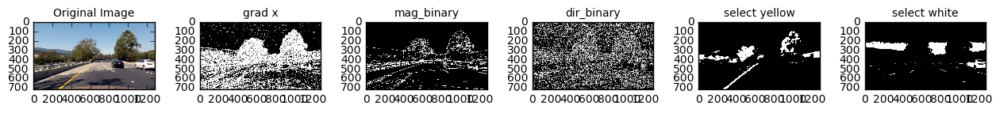

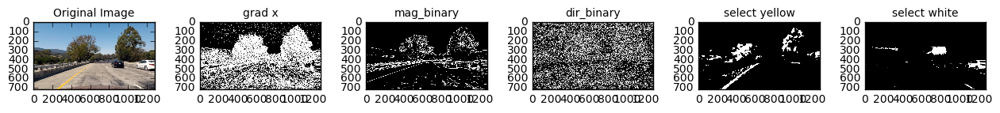

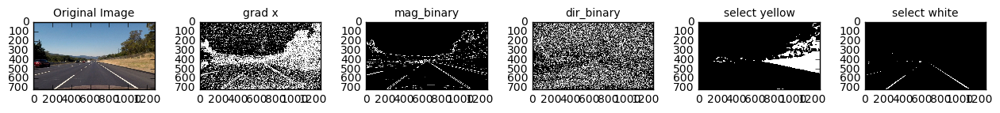

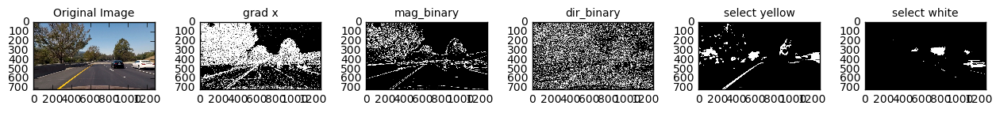

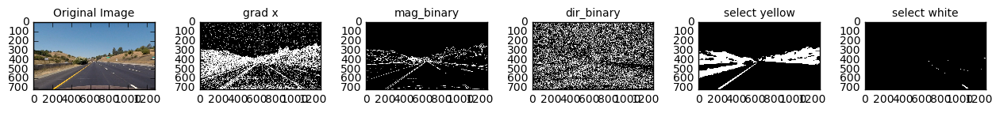

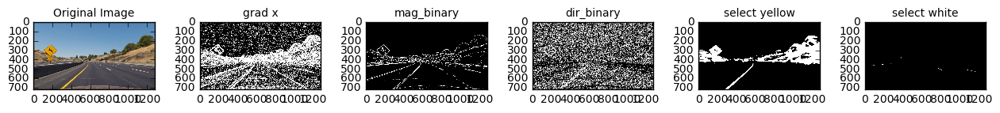

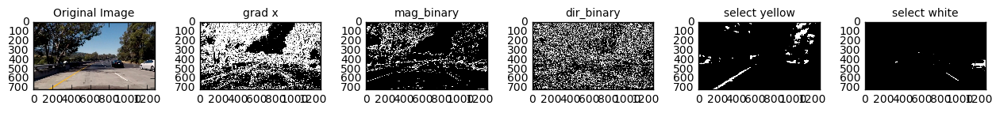

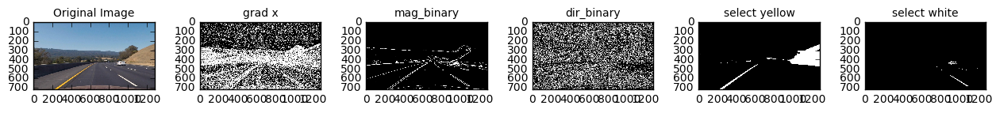

In [40]:
from lane import Binary_Threshold
ksize = 3
# img = image_list[0]
for img in image_list:
    img = cv2.undistort(img, mtx, dist, None, mtx)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    BTimg = Binary_Threshold(img)

    gradx = BTimg.abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh_min=2, thresh_max=210)
    mag_binary = BTimg.mag_thresh(img, sobel_kernel=ksize, mag_thresh=(30, 200))
    dir_binary = BTimg.dir_threshold(img, sobel_kernel=ksize, thresh=(0.3, 1.))
    ylw_binary = BTimg.yellow_select(img)
    wht_binary = BTimg.white_select(img)

    f, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(12, 5))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(gradx, cmap='gray')
    ax2.set_title('grad x', fontsize=10)
    ax3.imshow(mag_binary, cmap='gray')
    ax3.set_title('mag_binary', fontsize=10)
    ax4.imshow(dir_binary, cmap='gray')
    ax4.set_title('dir_binary', fontsize=10)
    ax5.imshow(ylw_binary, cmap='gray')
    ax5.set_title('select yellow', fontsize=10)
    ax6.imshow(wht_binary, cmap='gray')
    ax6.set_title('select white', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

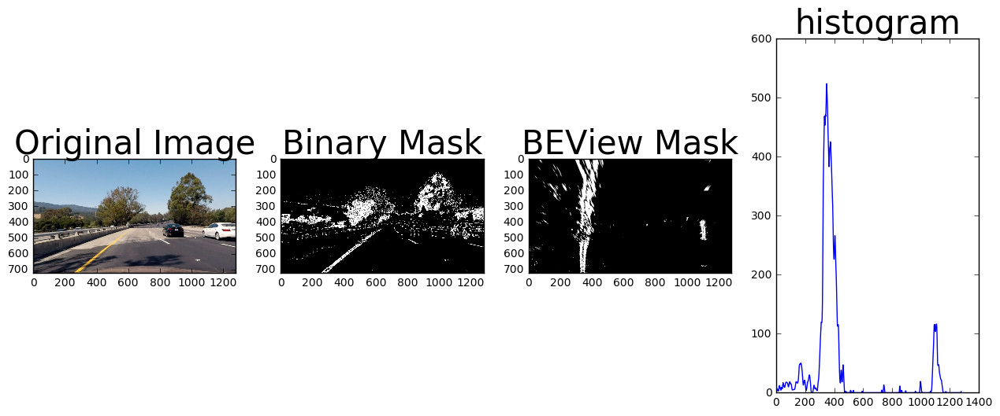

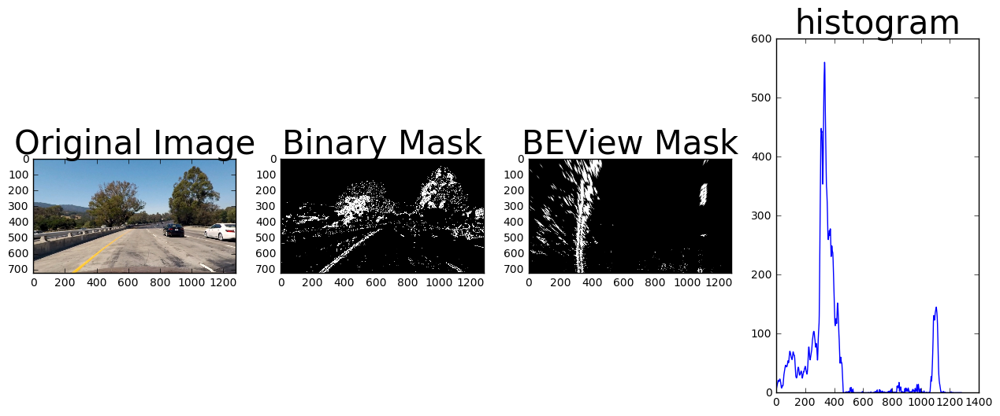

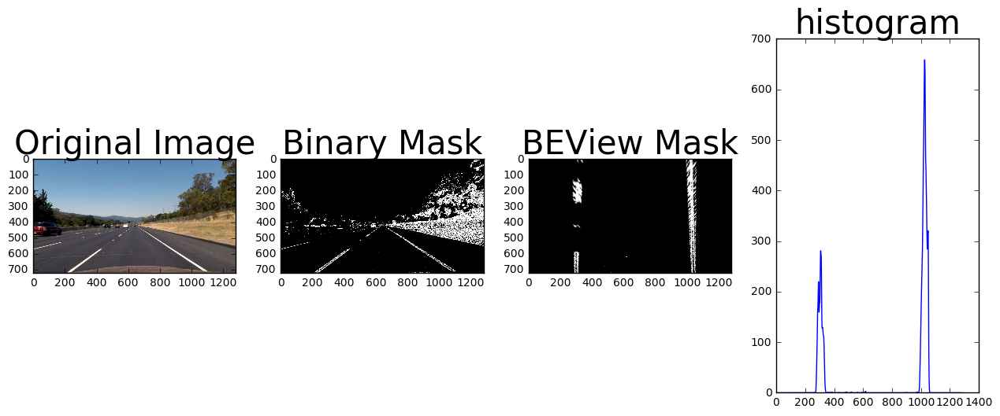

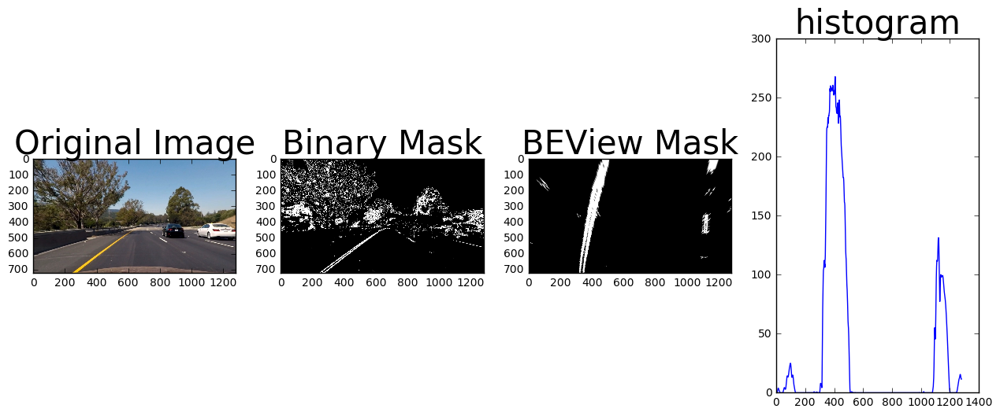

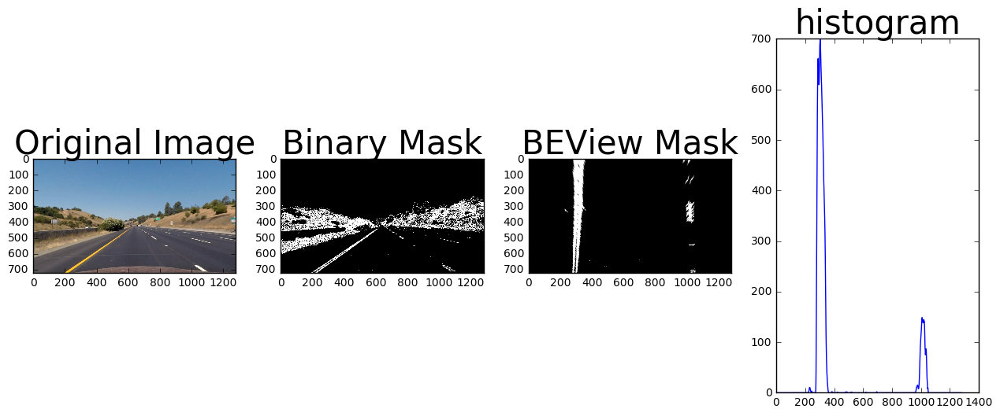

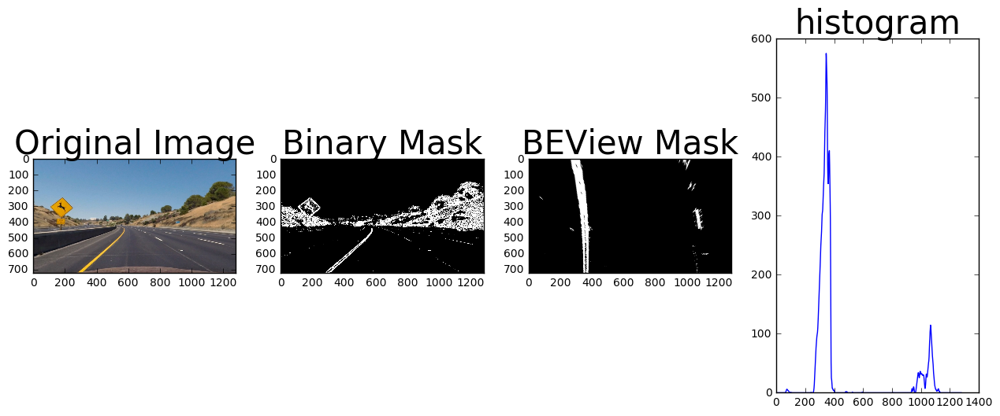

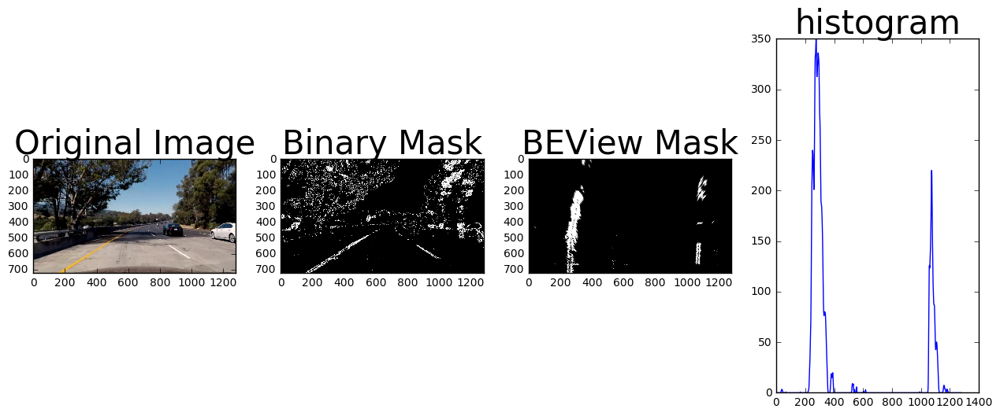

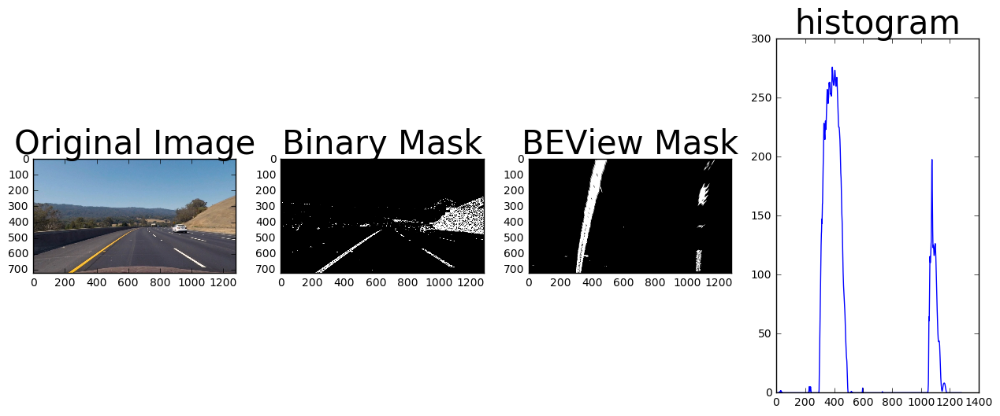

In [44]:
for img in image_list:
    img = cv2.undistort(img, mtx, dist, None, mtx)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = Binary_Threshold(img).mask
    binary_warped = cv2.warpPerspective(mask, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
    # Take a histogram of the image
    histogram = np.sum(binary_warped[:,:], axis=0)
    
    # Plot the result
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 5))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(mask, cmap='gray')
    ax2.set_title('Binary Mask', fontsize=30)
    ax3.imshow(binary_warped, cmap='gray')
    ax3.set_title('BEView Mask', fontsize=30)
    ax4.plot(histogram)
    ax4.set_title('histogram', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Find Lane Line

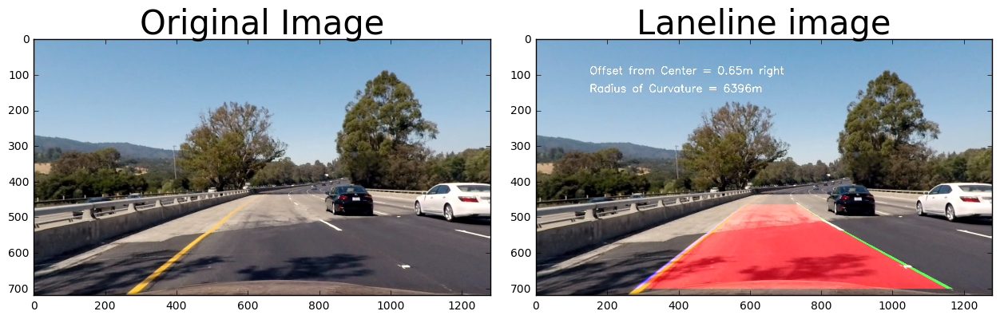

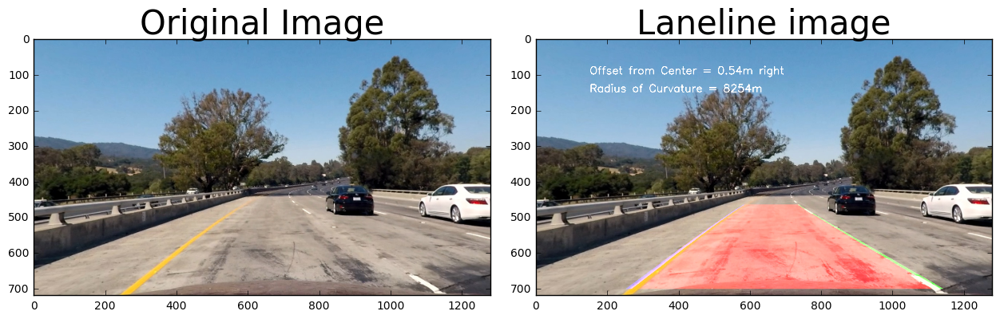

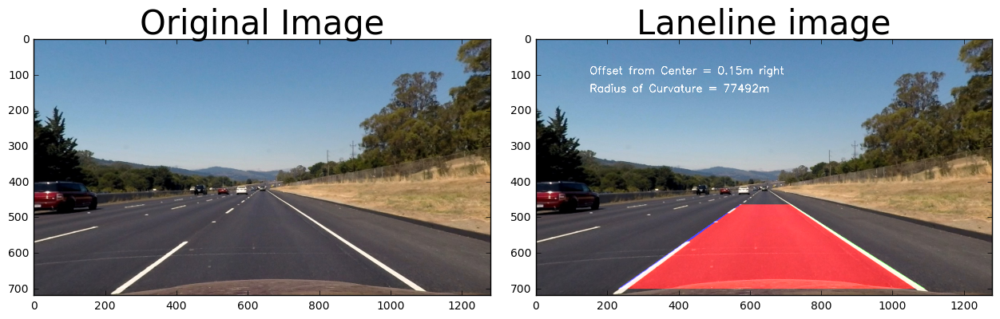

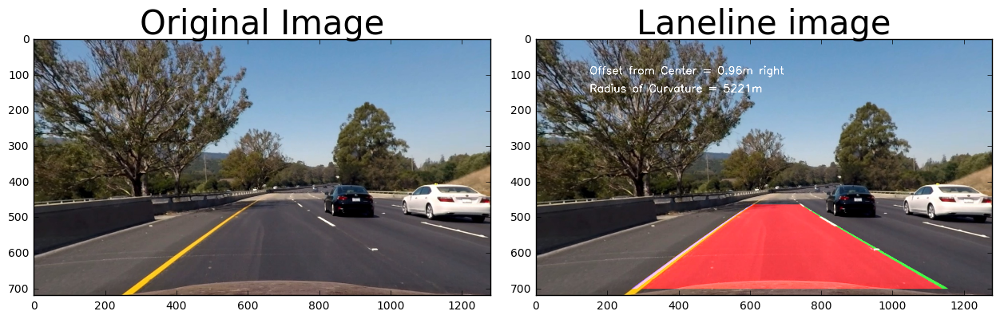

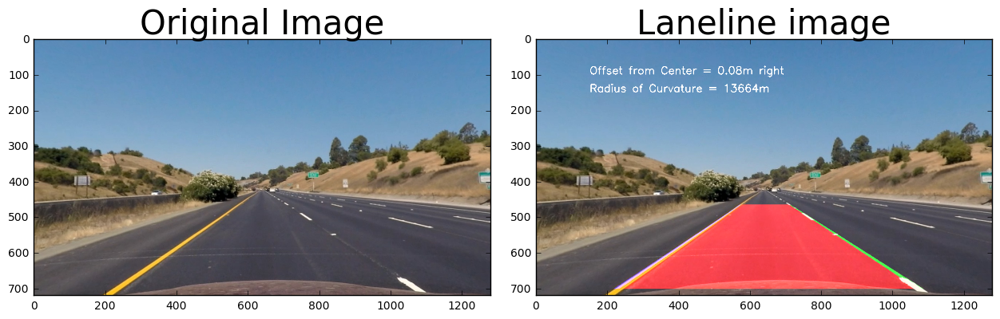

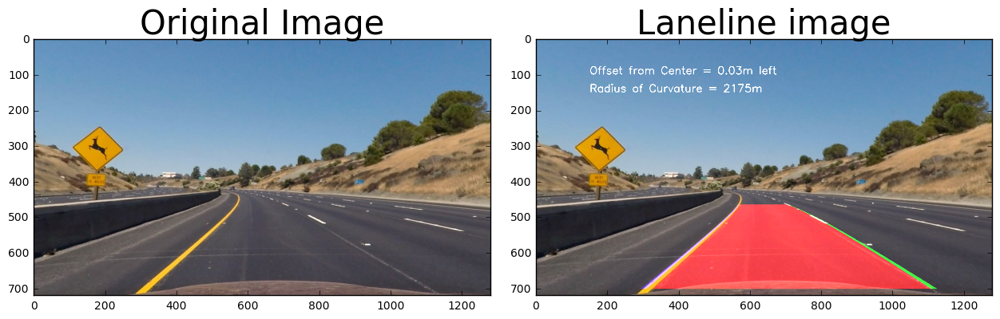

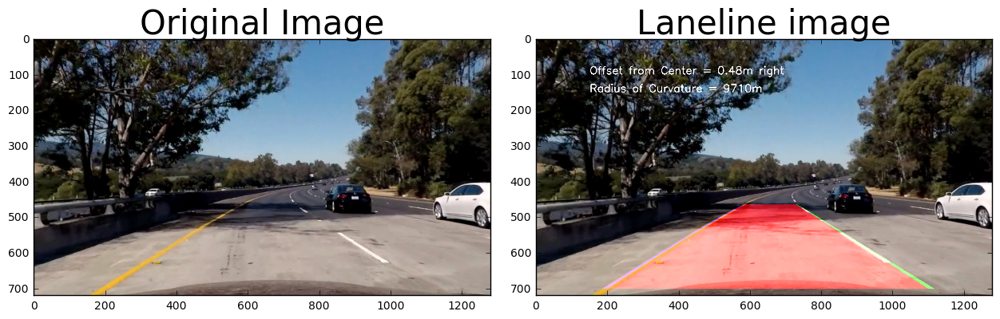

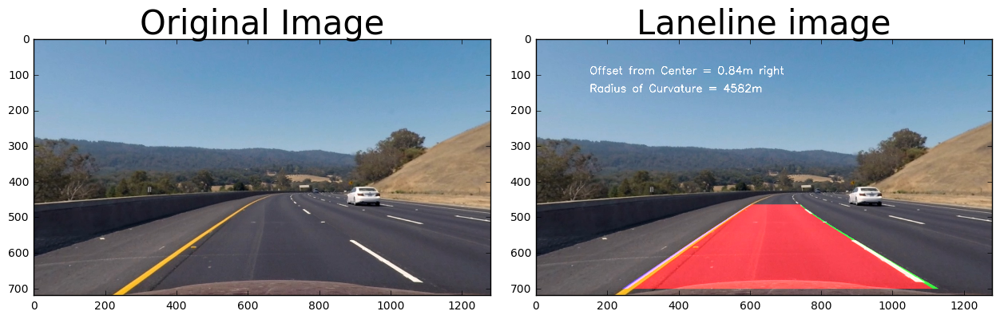

In [68]:
for i in range(len(image_list)):
    img = image_list[i]
    img = cv2.undistort(img, mtx, dist, None, mtx)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = Binary_Threshold(img).mask
    image_warped = cv2.warpPerspective(img, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
    binary_warped = cv2.warpPerspective(mask, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
    # Take a histogram of the image
    histogram = np.sum(binary_warped[:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Choose the number of sliding windows
    nwindows = 11
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 30
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    margin = 15
    window_img = np.zeros_like(image_warped)
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,0,255))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255,0))

    left_line = np.array([np.transpose(np.vstack([left_fitx[::-1], ploty[::-1]]))])
    right_line = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    line_pts = np.hstack((left_line, right_line))
    cv2.fillPoly(window_img, np.int_([line_pts]), (255,0,0))

    laneimage = cv2.warpPerspective(window_img, Minv, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
    outimage = cv2.addWeighted(img, 1, laneimage, 0.7, 0)

    
    # lane curvature without kalman filter
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1]*xm_per_pix)**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1]*xm_per_pix)**2)**1.5) / np.absolute(2*right_fit[0])
    curvature = (left_curverad + right_curverad) / 2.0
    cv2.putText(outimage, 'Radius of Curvature = %dm' % curvature, (150, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # vehicle offset without kalman filter
    offset = ((left_fitx[10] + right_fitx[10] - imshape[1]) / 2) * xm_per_pix
    if offset > 0:
        side = 'right'
    else:
        side = 'left'
    cv2.putText(outimage, 'Offset from Center = %.2fm %s' % (np.abs(offset), side), (150, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(outimage)
    ax2.set_title('Laneline image', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    outimage = cv2.cvtColor(outimage, cv2.COLOR_BGR2RGB)
    fname = 'output_images/'+file_list[i].split('/')[1]
    cv2.imwrite(fname, outimage)

# Video Processing

### The final output video is 'annotated_project_video.mp4'. 

### A linear kalman filter is included for better prediction on lane curvatures and offsets.

### The lane.py defines 5 classes:
##### -- cam_calibration() : calibrate cameras
##### -- PTransform() : perspective transform
##### -- Binary_Thresold() : provide the feature mask for images
##### -- KalmanFilter() : linear kalman filter
##### -- lane_detect() : detect & update lane lines on images


# Summary

1. The YUV color space turns out to be a great fit for selecting lane line colors (V space for yellow select, Y space for white select).
2. The initial curvature and offset estimation are noisy and only took advantage of a small portion from the output data into consideration. With a linear kalman filter included, the predicted results are stablized.
3. The current binary mask tends to be confused with dark lines. The performance can be improved by introducing more color selectors.
4. The fixed percpective transform method may run into problem with mountain roads. A dynamical percpective transform structure can improve the performance of the program.